Run this code after you have created the block level voting data, see README for details.

In [39]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import math

In [ ]:
block_votes = gpd.read_file('Data/BlockVotes/census_blocks_with_votes.shp')
block_votes

,STATEFP20,COUNTYFP20,TRACTCE20,BLOCKCE20,GEOID20,GEOIDFQ20,NAME20,MTFCC20,UR20,UACE20,...,INTPTLAT20,INTPTLON20,HOUSING20,POP20,precinct_i,rep_pct,dem_pct,RepVoters,DemVoters,geometry
0,12,091,020102,2035,120910201022035,1000000US120910201022035,Block2035,G5040,R,None,...,+30.8061445,-086.6775383,18,49,1037,0.888667,0.111333,44,5,"POLYGON ((-86.6807 30.80074, -86.68067 30.8008..."
1,12,091,021502,2018,120910215022018,1000000US120910215022018,Block2018,G5040,U,61372,...,+30.4465292,-086.5742819,8,19,1052,0.695979,0.304021,13,6,"POLYGON ((-86.57468 30.44711, -86.57385 30.447..."
2,12,091,021501,2005,120910215012005,1000000US120910215012005,Block2005,G5040,U,61372,...,+30.4422689,-086.5772939,0,0,1052,0.695979,0.304021,0,0,"POLYGON ((-86.57811 30.44255, -86.57726 30.442..."
3,12,091,020303,1034,120910203031034,1000000US120910203031034,Block1034,G5040,U,21043,...,+30.7974209,-086.5443412,19,55,1087,0.785246,0.214754,43,12,"POLYGON ((-86.54481 30.79866, -86.5448 30.7989..."
4,12,091,023100,1010,120910231001010,1000000US120910231001010,Block1010,G5040,U,61372,...,+30.4125455,-086.7281819,31,54,1070,0.665773,0.334227,36,18,"POLYGON ((-86.7286 30.41309, -86.72773 30.4130..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317471,12,081,002024,1016,120810020241016,1000000US120810020241016,Block1016,G5040,U,09536,...,+27.5187484,-082.4947687,125,270,926,0.674157,0.325843,182,88,"POLYGON ((-82.49813 27.52009, -82.49812 27.520..."
317472,12,081,001404,2007,120810014042007,1000000US120810014042007,Block2007,G5040,U,09536,...,+27.5500365,-082.5630562,1,6,921,0.609424,0.390576,4,2,"POLYGON ((-82.56463 27.54363, -82.56463 27.543..."
317473,12,081,001501,1021,120810015011021,1000000US120810015011021,Block1021,G5040,U,09536,...,+27.5325899,-082.5612507,3,11,936,0.175879,0.824121,2,9,"POLYGON ((-82.56156 27.53312, -82.56133 27.533..."
317474,12,081,001907,1015,120810019071015,1000000US120810019071015,Block1015,G5040,U,09536,...,+27.5300199,-082.4892644,0,0,925,0.640415,0.359585,0,0,"POLYGON ((-82.49874 27.53149, -82.49869 27.531..."


Add the census blocks randomly to 28 districts

In [32]:
block_votes['district'] = -1

total_pop = block_votes['POP20'].sum()
district_size = total_pop/28
lower_bound = district_size*0.9
upper_bound = district_size*1.1

working_df = block_votes.copy().reset_index(drop=False)

# Sorting by largest blocks first
working_df = working_df.sort_values(by='POP20', ascending=False).reset_index(drop=True)

# Create 28 district population count lists
district_pops = [0] * 28

for idx, row in working_df.iterrows():
    block_pop = row['POP20']
       
    # Add block to district with lowest population
    target_district = np.argmin(district_pops)
    working_df.loc[idx, 'district'] = target_district
    district_pops[target_district] += block_pop
    print(f"Index = {idx}, District = {target_district}, Population = {district_pops[target_district]}")

for idx, row in working_df.iterrows():
    original_idx = row['index']  # Get the original index value
    block_votes.loc[original_idx, 'district'] = row['district']

district_summary = block_votes.groupby('district')['POP20'].sum().reset_index()
district_summary['population_percentage'] = (district_summary['POP20'] / total_pop) * 100
district_summary['deviation_from_target'] = ((district_summary['POP20'] - district_size) / district_size) * 100
district_summary

Index = 0, District = 0, Population = 6107
Index = 1, District = 1, Population = 4475
Index = 2, District = 2, Population = 4011
Index = 3, District = 3, Population = 3904
Index = 4, District = 4, Population = 3357
Index = 5, District = 5, Population = 3060
Index = 6, District = 6, Population = 2954
Index = 7, District = 7, Population = 2928
Index = 8, District = 8, Population = 2911
Index = 9, District = 9, Population = 2899
Index = 10, District = 10, Population = 2841
Index = 11, District = 11, Population = 2823
Index = 12, District = 12, Population = 2822
Index = 13, District = 13, Population = 2797
Index = 14, District = 14, Population = 2795
Index = 15, District = 15, Population = 2748
Index = 16, District = 16, Population = 2745
Index = 17, District = 17, Population = 2743
Index = 18, District = 18, Population = 2702
Index = 19, District = 19, Population = 2679
Index = 20, District = 20, Population = 2669
Index = 21, District = 21, Population = 2660
Index = 22, District = 22, Pop

,district,POP20,population_percentage,deviation_from_target
0,0,591263,3.571433,0.000133
1,1,591263,3.571433,0.000133
2,2,591263,3.571433,0.000133
3,3,591263,3.571433,0.000133
4,4,591263,3.571433,0.000133
5,5,591263,3.571433,0.000133
6,6,591262,3.571427,-0.000036
7,7,591262,3.571427,-0.000036
8,8,591262,3.571427,-0.000036
9,9,591262,3.571427,-0.000036


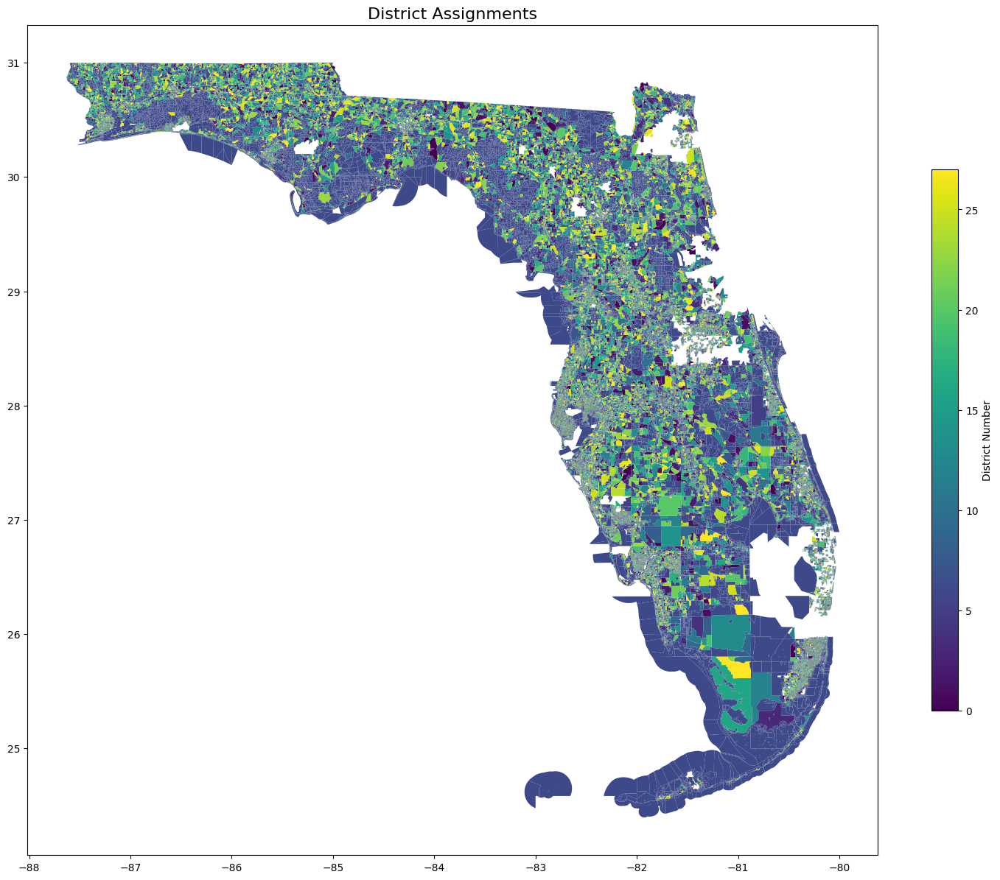

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15,15))
    
# Plot the geodataframe
block_votes.plot(
    column='district', 
    ax=ax,
    legend=True,
    legend_kwds={
        'label': "District Number",
        'orientation': "vertical",
        'shrink': 0.5,
        }
)
    
# Add title
ax.set_title("District Assignments", fontsize=16)
plt.tight_layout()

In [35]:
columns = ['ALAND20', 'AWATER20', 'HOUSING20', 'POP20', 'RepVoters', 'DemVoters']
    
# Create an aggregation dictionary for the specified columns
agg_dict = {col: 'sum' for col in columns if col in block_votes.columns}

district_map = block_votes.dissolve(
        by='district',
        aggfunc=agg_dict,
        as_index=True
    )
district_map = district_map.reset_index()

In [44]:
district_map

,district,geometry,ALAND20,AWATER20,HOUSING20,POP20,RepVoters,DemVoters,perimeter,area,polsby_popper,winning_threshold,winner,rep_wasted,dem_wasted
0,0,"MULTIPOLYGON (((-87.49081 30.28734, -87.49085 ...",2993699285,48984889,270919,591263,340567,250698,137.517214,0.281851,0.000187,295632.5,Republican,44934.5,250698.0
1,1,"MULTIPOLYGON (((-87.4876 30.2875, -87.48515 30...",3275624886,40385036,276282,591263,341022,250233,140.281023,0.306927,0.000196,295632.5,Republican,45389.5,250233.0
2,2,"MULTIPOLYGON (((-87.45494 30.31478, -87.45481 ...",3029784941,61134951,269161,591263,342461,248805,141.042799,0.286082,0.000181,295632.5,Republican,46828.5,248805.0
3,3,"MULTIPOLYGON (((-87.39551 30.31936, -87.39556 ...",3514271060,65037911,272316,591263,337469,253798,144.028819,0.330216,0.000200,295632.5,Republican,41836.5,253798.0
4,4,"MULTIPOLYGON (((-87.42912 30.31088, -87.42911 ...",2911668238,41107974,279320,591263,337792,253472,135.658399,0.273195,0.000187,295632.5,Republican,42159.5,253472.0
5,5,"MULTIPOLYGON (((-87.42594 30.31176, -87.42588 ...",3090206116,64327254,274420,591263,337241,254021,137.904337,0.291702,0.000193,295632.5,Republican,41608.5,254021.0
6,6,"MULTIPOLYGON (((-87.47046 30.29189, -87.47048 ...",41711451079,28866397487,278060,591262,335794,255468,1002.906833,6.480346,0.000081,295632.0,Republican,40162.0,255468.0
7,7,"MULTIPOLYGON (((-87.43333 30.31648, -87.43317 ...",3001570897,68251440,274007,591262,335672,255590,140.408073,0.284072,0.000181,295632.0,Republican,40040.0,255590.0
8,8,"MULTIPOLYGON (((-87.42144 30.29855, -87.42141 ...",3391526323,56449349,271392,591262,342500,248766,136.521816,0.318609,0.000215,295632.0,Republican,46868.0,248766.0
9,9,"MULTIPOLYGON (((-87.43596 30.31442, -87.43646 ...",3380776238,55754179,276669,591262,337500,253758,141.948862,0.317123,0.000198,295632.0,Republican,41868.0,253758.0


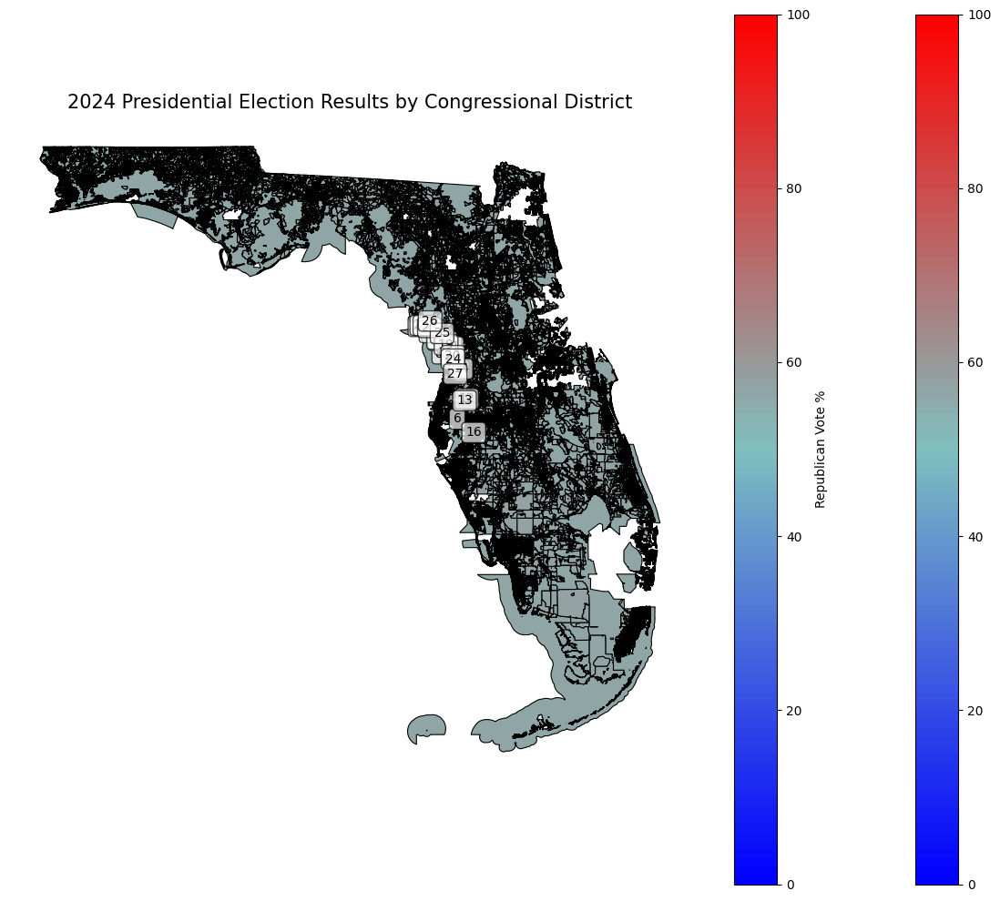

Congressional District Results:
    district  RepVoters  DemVoters   POP20    rep_pct    dem_pct     margin
0          0     340567     250698  591263  57.599917  42.400421  15.199497
1          1     341022     250233  591263  57.676871  42.321776  15.355096
2          2     342461     248805  591263  57.920249  42.080259  15.839990
3          3     337469     253798  591263  57.075954  42.924722  14.151232
4          4     337792     253472  591263  57.130583  42.869586  14.260997
5          5     337241     254021  591263  57.037393  42.962438  14.074955
6          6     335794     255468  591262  56.792759  43.207241  13.585517
7          7     335672     255590  591262  56.772125  43.227875  13.544249
8          8     342500     248766  591262  57.926943  42.073734  15.853209
9          9     337500     253758  591262  57.081294  42.918030  14.163264
10        10     338654     252613  591262  57.276470  42.724376  14.552094
11        11     337175     254080  591262  57.026327  4

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

district_map['RepVoters'] = district_map['RepVoters'].fillna(0)
district_map['DemVoters'] = district_map['DemVoters'].fillna(0)

# Handle potential division by zero
district_map['rep_pct'] = np.where(
    district_map['POP20'] > 0,
    district_map['RepVoters'] / district_map['POP20'] * 100,
    50  # Default to 50% if no votes
)

district_map['dem_pct'] = np.where(
    district_map['POP20'] > 0,
    district_map['DemVoters'] / district_map['POP20'] * 100,
    50  # Default to 50% if no votes
)

district_map['margin'] = district_map['rep_pct'] - district_map['dem_pct']

colors = [(0, 0, 1), (0.5, 0.75, 0.75), (1, 0, 0)]  # Blue -> Light Purple -> Red
cmap_name = 'election'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=100)

fig, ax = plt.subplots(1, 1, figsize=(12, 10))

district_map.plot(
    column='rep_pct',
    cmap=cm,
    linewidth=0.8,
    ax=ax,
    edgecolor='black',
    legend=True,
    vmin=0,
    vmax=100
)

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cm, norm=plt.Normalize(vmin=0, vmax=100))
sm._A = []
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Republican Vote %')

# Add labels
for idx, row in district_map.iterrows():
    # Get the centroid of the district
    centroid = row.geometry.centroid
    ax.text(
        centroid.x, centroid.y, 
        str(row['district']),  
        fontsize=10,
        ha='center', va='center',
        color='black',
        bbox=dict(facecolor='white', alpha=0.7, boxstyle="round,pad=0.3")
    )

plt.title('2024 Presidential Election Results by Congressional District', fontsize=15)
plt.axis('off')
plt.tight_layout()
plt.savefig('Data/new_district_election_results_map.png', dpi=300, bbox_inches='tight')
plt.show()

print("Congressional District Results:")
summary_table = district_map[['district', 'RepVoters', 'DemVoters', 'POP20', 'rep_pct', 'dem_pct', 'margin']].sort_values('district')
print(summary_table)

total_rep = district_map['RepVoters'].sum()
total_dem = district_map['DemVoters'].sum()
total_votes = total_rep + total_dem
rep_state_pct = (total_rep / total_votes) * 100
dem_state_pct = (total_dem / total_votes) * 100

print(f"\nStatewide Totals:")
print(f"Trump/Vance: {total_rep:,.0f} votes ({rep_state_pct:.1f}%)")
print(f"Harris/Walz: {total_dem:,.0f} votes ({dem_state_pct:.1f}%)")
print(f"Total Votes: {total_votes:,.0f}")

In [ ]:
district_map['perimeter'] = district_map.geometry.length
district_map['area'] = district_map.geometry.area
    
# Calculate Polsby-Popper score
# Score = 4π × Area ÷ (Perimeter²)
district_map['polsby_popper'] = (4 * math.pi * district_map['area']) / (district_map['perimeter'] ** 2)

# Calculate wasted votes for each party in each district, just using population totals for now. 
district_map['winning_threshold'] = district_map['POP20'] / 2 + 1
    
# Determine winner in each district
district_map['winner'] = np.where(
    district_map['RepVoters'] > district_map['DemVoters'],
    'Republican',
    'Democrat'
)
    
# Calculate wasted votes
conditions = [district_map['winner'] == 'Republican', district_map['winner'] == 'Democrat']
    
# Wasted Republican votes
rep_choices = [
    district_map['RepVoters'] - district_map['winning_threshold'],
    district_map['RepVoters']
]
district_map['rep_wasted'] = np.select(conditions, rep_choices)
    
# Wasted Democratic votes
dem_choices = [
    district_map['DemVoters'],
    district_map['DemVoters'] - district_map['winning_threshold']
]
district_map['dem_wasted'] = np.select(conditions, dem_choices)

 # Calculate totals
total_rep_wasted = district_map['rep_wasted'].sum()
total_dem_wasted = district_map['dem_wasted'].sum()
total_votes = district_map['POP20'].sum()
    
efficiency_gap = (total_rep_wasted - total_dem_wasted) / total_votes
print(f"Efficiency Gap {efficiency_gap}")

C:\Users\peyt1\AppData\Local\Temp\ipykernel_7336\980101009.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  district_map['perimeter'] = district_map.geometry.length
C:\Users\peyt1\AppData\Local\Temp\ipykernel_7336\980101009.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  district_map['area'] = district_map.geometry.area


Efficiency Gap -0.354338859324078
